In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import umap_ as UMAP

In [8]:
DATA_PATH = Path.cwd() / "../data"
data = {
    Path(f).stem: pd.read_csv(f, index_col=0) for f in DATA_PATH.glob("combined_*.csv")
}
print(list(data.keys()))

['combined_metrics_finished_edges', 'combined_metrics_finished_paths', 'combined_metrics_unfinished_edges', 'combined_metrics_unfinished_paths']


In [9]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)
display(features_finished_paths.dropna(subset=["hashedIpAddress"]))
display(features_unfinished_paths)

,hashedIpAddress,timestamp,durationInSec,path,rating,backtrack,numberOfPath,path_length,coarse_mean_time,position_mean,...,optimal_path_length,average_time_on_page,sucessive_pairs,sucessive_pairs_encoded,semantic_similarity,path_degree_abs_sum,path_clustering_abs_sum,path_degree_centrality_abs_sum,path_betweenness_abs_sum,path_closeness_abs_sum
0,6a3701d319fc3754,2011-02-15 03:26:49,166,"['14th_century', '15th_century', '16th_century...",NaN,0,3.0,9,18.444444,0.284902,...,3.0,1.371901,"[('14th_century', '15th_century'), ('15th_cent...","[0.8438330292701721, 0.8465813398361206, 0.265...",0.596161,5.197422,-3.233355,-3.234431,-5.004633,-2.964052
1,3824310e536af032,2012-08-12 06:36:52,88,"['14th_century', 'Europe', 'Africa', 'Atlantic...",3.0,0,13.0,5,17.600000,0.167841,...,3.0,1.313433,"[('14th_century', 'Europe'), ('Europe', 'Afric...","[0.254788875579834, 0.6508224606513977, 0.3347...",0.528948,7.010212,-2.318889,-1.421642,-3.524030,-1.640078
2,415612e93584d30e,2012-10-03 21:10:40,138,"['14th_century', 'Niger', 'Nigeria', 'British_...",NaN,0,19.0,8,17.250000,0.214077,...,3.0,1.422680,"[('14th_century', 'Niger'), ('Niger', 'Nigeria...","[0.22429417073726654, 0.7818886637687683, 0.39...",0.488120,5.236336,-3.212821,-3.195518,-4.962358,-2.938361
3,64dd5cd342e3780c,2010-02-08 07:25:25,37,"['14th_century', 'Renaissance', 'Ancient_Greec...",NaN,0,2.0,4,9.250000,0.223735,...,2.0,0.804348,"[('14th_century', 'Renaissance'), ('Renaissanc...","[0.3987608551979065, 0.3302411735057831, 0.666...",0.465273,NaN,NaN,NaN,NaN,NaN
4,015245d773376aab,2013-04-23 15:27:08,175,"['14th_century', 'Italy', 'Roman_Catholic_Chur...",3.0,0,1.0,7,25.000000,0.316027,...,3.0,1.666667,"[('14th_century', 'Italy'), ('Italy', 'Roman_C...","[0.1762578785419464, 0.3073163628578186, 0.214...",0.333869,6.315864,-2.737924,-2.115989,-4.991059,-2.013457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51304,15a13a1d66ef5456,2012-10-03 02:23:35,66,"['Yagan', 'Ancient_Egypt', 'Civilization']",NaN,0,3.0,3,22.000000,NaN,...,2.0,2.062500,"[('Yagan', 'Ancient_Egypt'), ('Ancient_Egypt',...","[0.17201459407806396, 0.40563249588012695]",0.288824,5.209486,-2.320631,-3.222367,-5.666352,-1.732727
51305,2ef7ac844cefda58,2011-03-16 05:42:18,165,"['Yagan', 'Folklore', 'Brothers_Grimm', '19th_...",3.0,1,7.0,8,18.333333,0.346339,...,3.0,1.833333,"[('Yagan', 'Folklore'), ('Folklore', 'Brothers...","[0.2101505994796753, 0.29172447323799133, 0.24...",0.346520,4.297096,-4.423940,-4.134757,-5.967147,-3.460478
51306,12863abb7887f890,2013-11-22 04:42:52,228,"['Yagan', 'Australia', 'England', 'France', 'U...",NaN,0,2.0,7,32.571429,0.151467,...,3.0,3.081081,"[('Yagan', 'Australia'), ('Australia', 'Englan...","[0.12989795207977295, 0.7208417654037476, 0.62...",0.396291,6.343111,-2.115506,-2.088742,-3.527183,-2.438024
51307,19f8284371753362,2011-02-27 07:42:47,56,"['Yarralumla%2C_Australian_Capital_Territory',...",1.0,0,8.0,4,14.000000,0.153554,...,2.0,0.682927,[('Yarralumla%2C_Australian_Capital_Territory'...,"[0.4492543637752533, 0.41598689556121826, 0.44...",0.436014,7.695758,-1.820454,-0.736095,-2.147011,-1.268453


,index,hashedIpAddress,timestamp,durationInSec,path,target,type,backtrack,numberOfPath,path_length,...,optimal_path_length,average_time_on_page,sucessive_pairs,sucessive_pairs_encoded,semantic_similarity,path_degree_abs_sum,path_clustering_abs_sum,path_degree_centrality_abs_sum,path_betweenness_abs_sum,path_closeness_abs_sum
0,2,2b015fb8181c48f2,2011-02-07 15:00:19,1818,"['Malawi', 'Democracy', 'Alexander_the_Great']",First_Crusade,timeout,0,1.0,3,...,3.0,50.500000,"[('Malawi', 'Democracy'), ('Democracy', 'Alexa...","[0.3289797902107239, 0.15958838164806366]",0.244284,4.624973,-1.658146,-3.806880,-6.527886,-2.041349
1,4,53a53bc244e08a6a,2011-02-07 17:18:25,1808,"['Paraguay', 'Bolivia']",Mount_St._Helens,timeout,0,1.0,2,...,3.0,113.000000,"[('Paraguay', 'Bolivia')]",[0.7933145761489868],0.793315,NaN,NaN,NaN,NaN,NaN
2,5,131600803df4895e,2011-02-07 17:42:37,2009,"['Agriculture', 'History_of_the_world', 'China...",Grand_Canal_of_China,timeout,0,1.0,4,...,3.0,38.634615,"[('Agriculture', 'History_of_the_world'), ('Hi...","[0.26539474725723267, 0.2245648205280304, 0.37...",0.288841,6.429719,-1.952055,-2.002134,-4.467183,-1.925200
3,6,486bb79910fe9dd2,2011-02-07 18:01:00,1932,"['Mind', 'Christianity', 'Europe', 'Renaissanc...",Scouting,timeout,0,1.0,7,...,4.0,28.411765,"[('Mind', 'Christianity'), ('Christianity', 'E...","[0.23058123886585236, 0.3337669372558594, 0.30...",0.376883,5.705032,-3.544534,-2.726821,-4.845663,-2.936609
4,7,6d136e371e42474f,2011-02-07 18:07:50,175,"['4-2-0', 'United_States', 'Agriculture', 'Sug...",Cane_Toad,restart,0,170.0,5,...,5.0,3.723404,"[('4-2-0', 'United_States'), ('United_States',...","[0.19640374183654785, 0.23717810213565826, 0.3...",0.245052,7.585732,-2.590255,-0.846121,-2.271594,-0.927471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19647,24869,109ed71f571d86e9,2014-01-15 12:00:12,182,"['Turks_and_Caicos_Islands', 'United_States', ...",Iraq_War,restart,0,35.0,6,...,3.0,2.527778,"[('Turks_and_Caicos_Islands', 'United_States')...","[0.4149491488933563, 0.40031805634498596, 0.39...",0.421867,7.555088,-1.505405,-0.876766,-2.304742,-1.574654
19648,24870,109ed71f571d86e9,2014-01-15 12:06:45,180,"['Franz_Kafka', 'Tuberculosis', 'World_Health_...",Cholera,restart,1,37.0,7,...,3.0,1.894737,"[('Franz_Kafka', 'Tuberculosis'), ('Tuberculos...","[0.2173137366771698, 0.34790855646133423, 0.42...",0.358657,3.669951,-3.305998,-4.761902,-7.644179,-4.383847
19649,24872,2e09a7224600a7cd,2014-01-15 15:06:40,1900,"['Computer_programming', 'Linguistics', 'Cultu...",The_Beatles,timeout,1,5.0,4,...,3.0,33.928571,"[('Computer_programming', 'Linguistics'), ('Li...","[0.2608160674571991, 0.5456496477127075, 0.600...",0.468859,4.760035,-2.802979,-3.671818,-6.478384,-2.157703
19650,24873,60af9e2138051b96,2014-01-15 15:24:41,1903,"['Jamaica', 'United_Kingdom', 'World_War_II', ...",Alan_Turing,timeout,0,1.0,4,...,3.0,36.596154,"[('Jamaica', 'United_Kingdom'), ('United_Kingd...","[0.39752137660980225, 0.3371908664703369, 0.42...",0.387896,7.158709,-1.836719,-1.273145,-2.951980,-1.724655


In [10]:
features_finished_paths.columns

Index(['hashedIpAddress', 'timestamp', 'durationInSec', 'path', 'rating',
       'backtrack', 'numberOfPath', 'path_length', 'coarse_mean_time',
       'position_mean', 'position_std', 'optimal_path_length',
       'average_time_on_page', 'sucessive_pairs', 'sucessive_pairs_encoded',
       'semantic_similarity', 'path_degree_abs_sum', 'path_clustering_abs_sum',
       'path_degree_centrality_abs_sum', 'path_betweenness_abs_sum',
       'path_closeness_abs_sum'],
      dtype='object')

In [11]:
features_cols_used_for_clustering = [
    "durationInSec",
    #   'rating_x',
    "backtrack",
    "numberOfPath",
    # "link_position",
    "position_mean",
    "position_std",
    "path_length",
    #  'optimal_path_length',
    "coarse_mean_time",
    "semantic_similarity",
    # "path_degree_abs_sum",
    # "path_clustering_abs_sum",
    # 'path_degree_centrality_abs_sum',
    # 'path_betweenness_abs_sum',
    'path_closeness_abs_sum'
    
]
len(features_cols_used_for_clustering)

9

In [12]:
cols_replace_nan_with_mean = [ # cols where nan values are replaced with mean of the column
#     "path_degree_slope_before",
#     "path_degree_slope_after",
#     "path_clustering_slope_before",
#     "path_clustering_slope_after",
#     "path_degree_centrality_slope_before",
#     "path_degree_centrality_slope_after",
#     "path_betweenness_slope_before",
#     "path_betweenness_slope_after",
#     "path_closeness_slope_before",
#     "path_closeness_slope_after",
    "path_degree_abs_sum",
    "path_clustering_abs_sum",
    'path_degree_centrality_abs_sum',
    'path_betweenness_abs_sum',
    'path_closeness_abs_sum'
]


def replace_nan_with_mean(df, cols):
    for col in cols:
        df[col] = df[col].fillna(df[col].mean())
    return df

def replace_value_with_mean(df, cols, value):
    for col in cols:
        df[col] = df[col].replace(value, df[col].mean())
    return df

features_finished_paths_replaced = replace_nan_with_mean(
    features_finished_paths, cols_replace_nan_with_mean
)
features_unfinished_paths_replaced = replace_nan_with_mean(
    features_unfinished_paths, cols_replace_nan_with_mean
)
features_finished_paths_replaced = features_finished_paths
features_unfinished_paths_replaced = features_unfinished_paths

In [13]:
cols_log = [ # cols to apply log transformation
    "durationInSec",
    #   'rating_x',
    # "backtrack",
    "numberOfPath",
    # "link_position",
    "path_length",
    #  'optimal_path_length',
    "coarse_mean_time",
    # "semantic_similarity",
    # "path_degree_slope_before",
    # "path_degree_slope_after",
    # "path_clustering_slope_before",
    # "path_clustering_slope_after",
    # "path_degree_centrality_slope_before",
    # "path_degree_centrality_slope_after",
    # "path_betweenness_slope_before",
    # "path_betweenness_slope_after",
    # "path_closeness_slope_before",
    # "path_closeness_slope_after",
]
features_finished_paths_replaced_log = features_finished_paths_replaced.copy()
features_finished_paths_replaced_log[cols_log] = np.log(features_finished_paths_replaced_log[cols_log])
features_unfinished_paths_replaced_log = features_unfinished_paths_replaced.copy()
features_unfinished_paths_replaced_log[cols_log] = np.log(features_unfinished_paths_replaced_log[cols_log])

In [14]:
# z-score all features columns
features_finished_paths_zscore = features_finished_paths_replaced_log.copy()
features_finished_paths_zscore[features_cols_used_for_clustering] = features_finished_paths_zscore[
    features_cols_used_for_clustering
].apply(lambda x: (x - x.mean()) / x.std())
display(features_finished_paths_zscore)

features_unfinished_paths_zscore = features_unfinished_paths_replaced_log.copy()
features_unfinished_paths_zscore[features_cols_used_for_clustering] = features_unfinished_paths_zscore[
    features_cols_used_for_clustering
].apply(lambda x: (x - x.mean()) / x.std())
display(features_unfinished_paths_zscore)

,hashedIpAddress,timestamp,durationInSec,path,rating,backtrack,numberOfPath,path_length,coarse_mean_time,position_mean,...,optimal_path_length,average_time_on_page,sucessive_pairs,sucessive_pairs_encoded,semantic_similarity,path_degree_abs_sum,path_clustering_abs_sum,path_degree_centrality_abs_sum,path_betweenness_abs_sum,path_closeness_abs_sum
0,6a3701d319fc3754,2011-02-15 03:26:49,0.525935,"['14th_century', '15th_century', '16th_century...",NaN,-0.276111,-0.427809,1.072539,0.107413,0.087182,...,3.0,1.371901,"[('14th_century', '15th_century'), ('15th_cent...","[0.8438330292701721, 0.8465813398361206, 0.265...",1.906754,5.197422,-3.233355,-3.234431,-5.004633,-0.445707
1,3824310e536af032,2012-08-12 06:36:52,-0.173342,"['14th_century', 'Europe', 'Africa', 'Atlantic...",3.0,-0.276111,0.233284,-0.359181,0.037613,-0.533082,...,3.0,1.313433,"[('14th_century', 'Europe'), ('Europe', 'Afric...","[0.254788875579834, 0.6508224606513977, 0.3347...",1.159513,7.010212,-2.318889,-1.421642,-3.524030,0.923916
2,415612e93584d30e,2012-10-03 21:10:40,0.322389,"['14th_century', 'Niger', 'Nigeria', 'British_...",NaN,-0.276111,0.404376,0.785645,0.007696,-0.288094,...,3.0,1.422680,"[('14th_century', 'Niger'), ('Niger', 'Nigeria...","[0.22429417073726654, 0.7818886637687683, 0.39...",0.705604,5.236336,-3.212821,-3.195518,-4.962358,-0.419131
3,64dd5cd342e3780c,2010-02-08 07:25:25,-1.127988,"['14th_century', 'Renaissance', 'Ancient_Greec...",NaN,-0.276111,-0.610612,-0.902711,-0.920490,-0.236922,...,2.0,0.804348,"[('14th_century', 'Renaissance'), ('Renaissanc...","[0.3987608551979065, 0.3302411735057831, 0.666...",0.451605,5.727391,-2.924257,-2.704462,-4.896963,0.000000
4,015245d773376aab,2013-04-23 15:27:08,0.584109,"['14th_century', 'Italy', 'Roman_Catholic_Chur...",3.0,-0.276111,-0.923115,0.460392,0.560363,0.252102,...,3.0,1.666667,"[('14th_century', 'Italy'), ('Italy', 'Roman_C...","[0.1762578785419464, 0.3073163628578186, 0.214...",-1.009289,6.315864,-2.737924,-2.115989,-4.991059,0.537664
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51304,15a13a1d66ef5456,2012-10-03 02:23:35,-0.490319,"['Yagan', 'Ancient_Egypt', 'Civilization']",NaN,-0.276111,-0.427809,-1.603442,0.369966,NaN,...,2.0,2.062500,"[('Yagan', 'Ancient_Egypt'), ('Ancient_Egypt',...","[0.17201459407806396, 0.40563249588012695]",-1.510087,5.209486,-2.320631,-3.222367,-5.666352,0.828073
51305,2ef7ac844cefda58,2011-03-16 05:42:18,0.519277,"['Yagan', 'Folklore', 'Brothers_Grimm', '19th_...",3.0,0.412911,-0.045808,0.785645,0.098414,0.412718,...,3.0,1.833333,"[('Yagan', 'Folklore'), ('Folklore', 'Brothers...","[0.2101505994796753, 0.29172447323799133, 0.24...",-0.868646,4.297096,-4.423940,-4.134757,-5.967147,-0.959250
51306,12863abb7887f890,2013-11-22 04:42:52,0.875609,"['Yagan', 'Australia', 'England', 'France', 'U...",NaN,-0.276111,-0.610612,0.460392,0.954402,-0.619844,...,3.0,3.081081,"[('Yagan', 'Australia'), ('Australia', 'Englan...","[0.12989795207977295, 0.7208417654037476, 0.62...",-0.315312,6.343111,-2.115506,-2.088742,-3.527183,0.098457
51307,19f8284371753362,2011-02-27 07:42:47,-0.671353,"['Yarralumla%2C_Australian_Capital_Territory',...",1.0,-0.276111,0.014395,-0.902711,-0.303227,-0.608784,...,2.0,0.682927,[('Yarralumla%2C_Australian_Capital_Territory'...,"[0.4492543637752533, 0.41598689556121826, 0.44...",0.126309,7.695758,-1.820454,-0.736095,-2.147011,1.308354


,index,hashedIpAddress,timestamp,durationInSec,path,target,type,backtrack,numberOfPath,path_length,...,optimal_path_length,average_time_on_page,sucessive_pairs,sucessive_pairs_encoded,semantic_similarity,path_degree_abs_sum,path_clustering_abs_sum,path_degree_centrality_abs_sum,path_betweenness_abs_sum,path_closeness_abs_sum
0,2,2b015fb8181c48f2,2011-02-07 15:00:19,1.087068,"['Malawi', 'Democracy', 'Alexander_the_Great']",First_Crusade,timeout,-0.323962,-0.971356,-0.715136,...,3.0,50.500000,"[('Malawi', 'Democracy'), ('Democracy', 'Alexa...","[0.3289797902107239, 0.15958838164806366]",-1.339492,4.624973,-1.658146,-3.806880,-6.527886,0.633243
1,4,53a53bc244e08a6a,2011-02-07 17:18:25,1.083233,"['Paraguay', 'Bolivia']",Mount_St._Helens,timeout,-0.323962,-0.971356,-1.386563,...,3.0,113.000000,"[('Paraguay', 'Bolivia')]",[0.7933145761489868],3.595005,5.683793,-3.118998,-2.748061,-4.922750,0.000000
2,5,131600803df4895e,2011-02-07 17:42:37,1.156516,"['Agriculture', 'History_of_the_world', 'China...",Grand_Canal_of_China,timeout,-0.323962,-0.971356,-0.238750,...,3.0,38.634615,"[('Agriculture', 'History_of_the_world'), ('Hi...","[0.26539474725723267, 0.2245648205280304, 0.37...",-0.939028,6.429719,-1.952055,-2.002134,-4.467183,0.759830
3,6,486bb79910fe9dd2,2011-02-07 18:01:00,1.129347,"['Mind', 'Christianity', 'Europe', 'Renaissanc...",Scouting,timeout,-0.323962,-0.971356,0.687943,...,4.0,28.411765,"[('Mind', 'Christianity'), ('Christianity', 'E...","[0.23058123886585236, 0.3337669372558594, 0.30...",-0.147735,5.705032,-3.544534,-2.726821,-4.845663,-0.342470
4,7,6d136e371e42474f,2011-02-07 18:07:50,-0.540139,"['4-2-0', 'United_States', 'Agriculture', 'Sug...",Cane_Toad,restart,-0.323962,3.019836,0.130764,...,5.0,3.723404,"[('4-2-0', 'United_States'), ('United_States',...","[0.19640374183654785, 0.23717810213565826, 0.3...",-1.332590,7.585732,-2.590255,-0.846121,-2.271594,1.847221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19647,24869,109ed71f571d86e9,2014-01-15 12:00:12,-0.512874,"['Turks_and_Caicos_Islands', 'United_States', ...",Iraq_War,restart,-0.323962,1.791618,0.432678,...,3.0,2.527778,"[('Turks_and_Caicos_Islands', 'United_States')...","[0.4149491488933563, 0.40031805634498596, 0.39...",0.256562,7.555088,-1.505405,-0.876766,-2.304742,1.141878
19648,24870,109ed71f571d86e9,2014-01-15 12:06:45,-0.520555,"['Franz_Kafka', 'Tuberculosis', 'World_Health_...",Cholera,restart,0.169336,1.834803,0.687943,...,3.0,1.894737,"[('Franz_Kafka', 'Tuberculosis'), ('Tuberculos...","[0.2173137366771698, 0.34790855646133423, 0.42...",-0.311545,3.669951,-3.305998,-4.761902,-7.644179,-1.919766
19649,24872,2e09a7224600a7cd,2014-01-15 15:06:40,1.117737,"['Computer_programming', 'Linguistics', 'Cultu...",The_Beatles,timeout,0.169336,0.279389,-0.238750,...,3.0,33.928571,"[('Computer_programming', 'Linguistics'), ('Li...","[0.2608160674571991, 0.5456496477127075, 0.600...",0.678910,4.760035,-2.802979,-3.671818,-6.478384,0.506433
19650,24873,60af9e2138051b96,2014-01-15 15:24:41,1.118833,"['Jamaica', 'United_Kingdom', 'World_War_II', ...",Alan_Turing,timeout,-0.323962,-0.971356,-0.238750,...,3.0,36.596154,"[('Jamaica', 'United_Kingdom'), ('United_Kingd...","[0.39752137660980225, 0.3371908664703369, 0.42...",-0.048755,7.158709,-1.836719,-1.273145,-2.951980,0.978396


c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


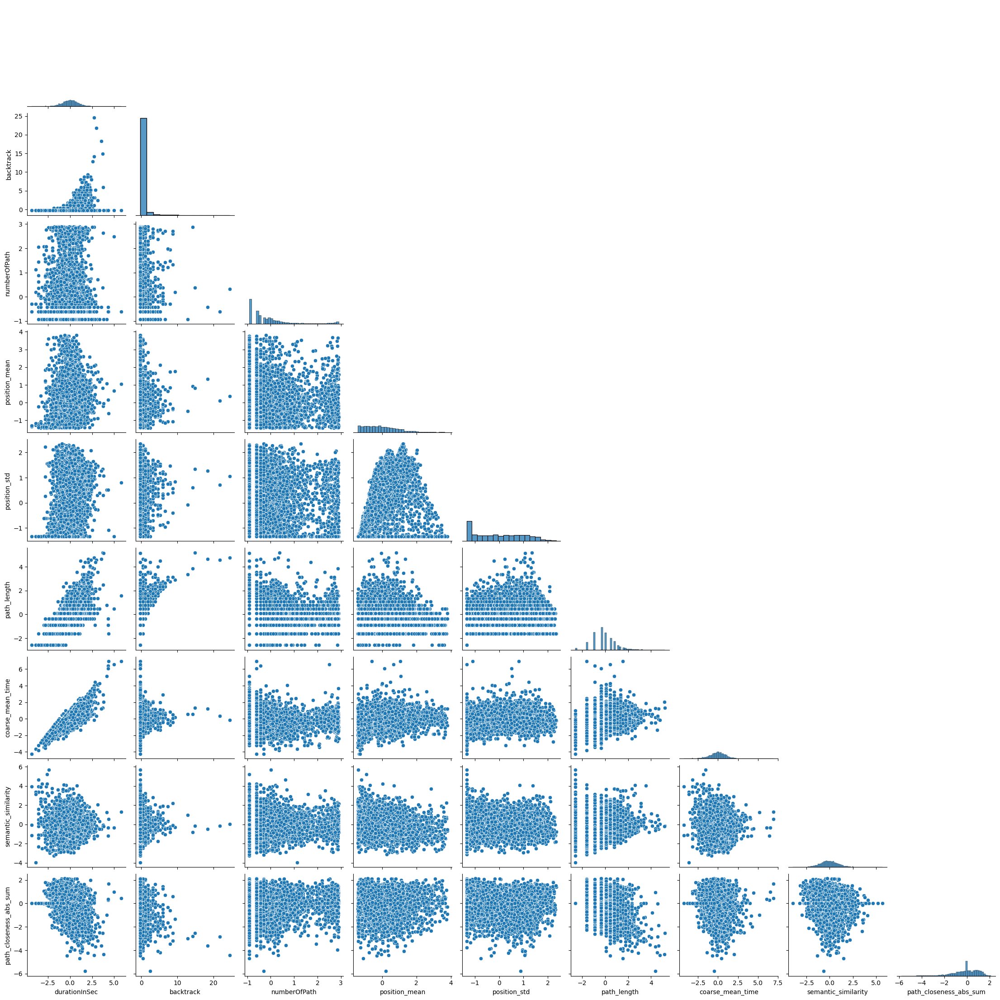

In [15]:
features_cols = features_finished_paths_zscore.columns
sns.pairplot(
    features_finished_paths_zscore[
        features_cols_used_for_clustering
        ].sample(5000),
    corner=True,
    diag_kind="hist",
    )

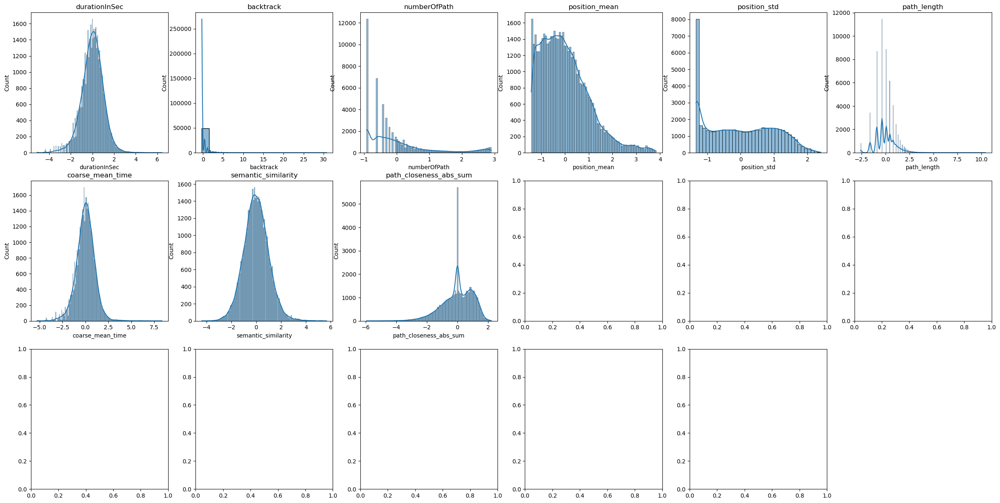

In [16]:
fig, axs = plt.subplots(3, 6, figsize=(30, 15))
axs.flatten()[-1].axis("off")
for i, feature in enumerate(features_cols_used_for_clustering):
    ax = axs.flatten()[i]
    sns.histplot(features_finished_paths_zscore[feature], kde=True, ax=ax)
    ax.set_title(feature)
plt.show()

In [17]:
features_finished_paths[features_cols_used_for_clustering].isna().sum()

durationInSec                0
backtrack                    0
numberOfPath                 3
position_mean             2024
position_std              2024
path_length                  0
coarse_mean_time             0
semantic_similarity          0
path_closeness_abs_sum       0
dtype: int64

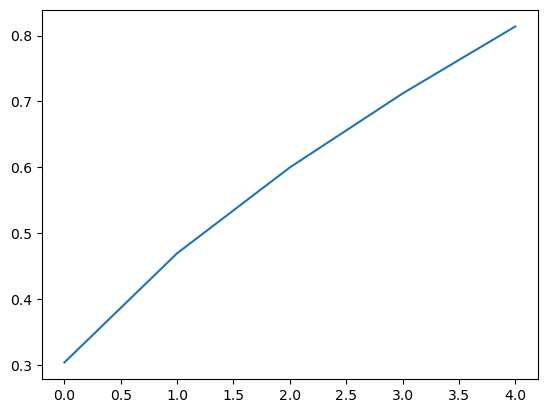

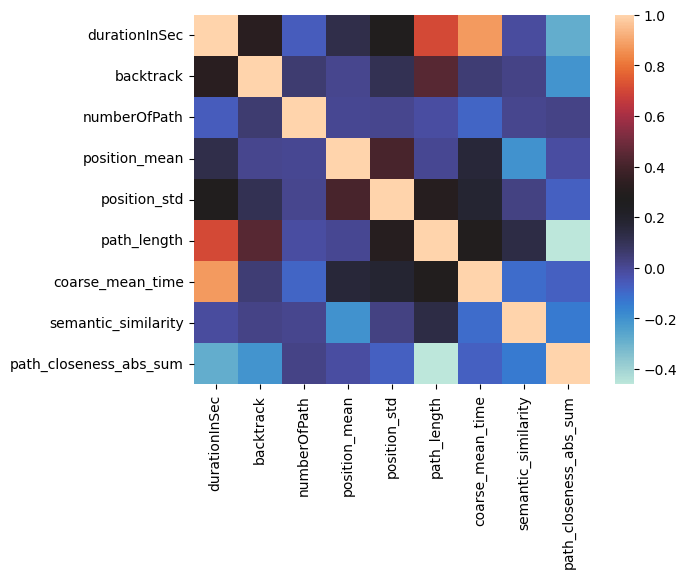

In [18]:
# run PCA on cols used for the pairplot
pca = PCA(n_components=5)
result = pca.fit_transform(features_finished_paths_zscore[features_cols_used_for_clustering].dropna())
# plot cumsum of explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()
# show correlation of features
sns.heatmap(
    features_finished_paths_zscore[features_cols_used_for_clustering].corr(),
    annot=False,
    cmap="icefire",
)
plt.show()

In [19]:
# plot the PCA results in 3D with plotly
import plotly.express as px

fig = px.scatter_3d(result, x=0, y=1, z=2, 
                    color=3
                    )
fig.show()

In [20]:
# # run t-SNE on cols used for the pairplot
# tsne = TSNE(n_components=3, metric="cosine")
# result = tsne.fit_transform(
#     features_finished_paths_zscore[features_cols_used_for_clustering].dropna()
# )

In [21]:
# # plot the t-SNE results in 3D with plotly
# fig = px.scatter_3d(
#     result,
#     x=0,
#     y=1,
#     z=2,
#     color=features_finished_paths_zscore[features_cols_used_for_clustering].dropna()[
#         "durationInSec"
#     ],
# )
# fig.show()

In [22]:
# UMAP
umap = UMAP.UMAP(n_components=3, metric="cosine")
result = umap.fit_transform(
    features_finished_paths_zscore[features_cols_used_for_clustering].dropna()
)

In [23]:
# plot the UMAP results in 3D with plotly
fig = px.scatter_3d(
    result,
    x=0,
    y=1,
    z=2,
    color=features_finished_paths_zscore[features_cols_used_for_clustering].dropna()[
        "path_length"
    ],
    title="UMAP,path_length slope before as color",
)
fig.show()

In [24]:
# # run t-SNE on cols used for the pairplot
# tsne = TSNE(n_components=3, metric="euclidean")
# result_tsne_euc = tsne.fit_transform(
#     features_finished_paths_zscore[features_cols_used_for_clustering].dropna()
# )

In [25]:
# # plot the t-SNE results in 3D with plotly
# fig = px.scatter_3d(
#     result_tsne_euc,
#     x=0,
#     y=1,
#     z=2,
#     color=features_finished_paths_zscore[features_cols_used_for_clustering]
#     .dropna()["path_length"]
#     # .apply(lambda x: np.log(x)),
# )
# fig.show()

In [26]:
# UMAP
umap = UMAP.UMAP(n_components=3, metric="euclidean")
result_umap_euc = umap.fit_transform(
    features_finished_paths_zscore[features_cols_used_for_clustering].dropna()
)

In [27]:
# plot the UMAP results in 3D with plotly
fig = px.scatter_3d(
    result_umap_euc,
    x=0,
    y=1,
    z=2,
    color=features_finished_paths_zscore[features_cols_used_for_clustering].dropna()[
        "path_length"
    ],
    title="UMAP, path path_length slope before as color",
)
fig.show()